"state", string. 2-letter code of the US state of customer residence

"account_length", numerical. Number of months the customer has been with the current telco provider

"area_code", string="area_code_AAA" where AAA = 3 digit area code.

"international_plan", (yes/no). The customer has international plan.

"voice_mail_plan", (yes/no). The customer has voice mail plan.

"number_vmail_messages", numerical. Number of voice-mail messages.

"total_day_minutes", numerical. Total minutes of day calls.

"total_day_calls", numerical. Total minutes of day calls.

"total_day_charge", numerical. Total charge of day calls.

"total_eve_minutes", numerical. Total minutes of evening calls.

"total_eve_calls", numerical. Total number of evening calls.

"total_eve_charge", numerical. Total charge of evening calls.

"total_night_minutes", numerical. Total minutes of night calls.

"total_night_calls", numerical. Total number of night calls.

"total_night_charge", numerical. Total charge of night calls.

"total_intl_minutes", numerical. Total minutes of international calls.

"total_intl_calls", numerical. Total number of international calls.

"total_intl_charge", numerical. Total charge of international calls

"number_customer_service_calls", numerical. Number of calls to customer service

"churn", (yes/no). Customer churn - target variable.

<br>


__Dataset link__: https://www.kaggle.com/c/customer-churn-prediction-2020/overview/description

### Load dependencies

In [1]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt

import seaborn as sns

In [2]:
# Setup Pandas max columns and rows display
pd.set_option("display.max_columns", 5000)
pd.set_option("display.max_rows", 5000)

In [4]:
# Load CSV file
train_data = pd.read_csv("data/train.csv")

In [5]:
train_data.head()

,state,account_length,area_code,international_plan,voice_mail_plan,number_vmail_messages,total_day_minutes,total_day_calls,total_day_charge,total_eve_minutes,total_eve_calls,total_eve_charge,total_night_minutes,total_night_calls,total_night_charge,total_intl_minutes,total_intl_calls,total_intl_charge,number_customer_service_calls,churn
0,OH,107,area_code_415,no,yes,26,161.6,123,27.47,195.5,103,16.62,254.4,103,11.45,13.7,3,3.70,1,no
1,NJ,137,area_code_415,no,no,0,243.4,114,41.38,121.2,110,10.30,162.6,104,7.32,12.2,5,3.29,0,no
2,OH,84,area_code_408,yes,no,0,299.4,71,50.90,61.9,88,5.26,196.9,89,8.86,6.6,7,1.78,2,no
3,OK,75,area_code_415,yes,no,0,166.7,113,28.34,148.3,122,12.61,186.9,121,8.41,10.1,3,2.73,3,no
4,MA,121,area_code_510,no,yes,24,218.2,88,37.09,348.5,108,29.62,212.6,118,9.57,7.5,7,2.03,3,no


In [6]:
# Create targets and features from the dataset
target = np.where(train_data['churn'].values == "no", 0, 1)
features = train_data.iloc[:, :-1]

# Replace churn column with the encoded version (yes=1, no=0)
train_data['churn'] = target

In [7]:
train_data.head()

,state,account_length,area_code,international_plan,voice_mail_plan,number_vmail_messages,total_day_minutes,total_day_calls,total_day_charge,total_eve_minutes,total_eve_calls,total_eve_charge,total_night_minutes,total_night_calls,total_night_charge,total_intl_minutes,total_intl_calls,total_intl_charge,number_customer_service_calls,churn
0,OH,107,area_code_415,no,yes,26,161.6,123,27.47,195.5,103,16.62,254.4,103,11.45,13.7,3,3.70,1,0
1,NJ,137,area_code_415,no,no,0,243.4,114,41.38,121.2,110,10.30,162.6,104,7.32,12.2,5,3.29,0,0
2,OH,84,area_code_408,yes,no,0,299.4,71,50.90,61.9,88,5.26,196.9,89,8.86,6.6,7,1.78,2,0
3,OK,75,area_code_415,yes,no,0,166.7,113,28.34,148.3,122,12.61,186.9,121,8.41,10.1,3,2.73,3,0
4,MA,121,area_code_510,no,yes,24,218.2,88,37.09,348.5,108,29.62,212.6,118,9.57,7.5,7,2.03,3,0


### Data analysis

c:\users\marakujaaleluja\anaconda3\envs\tf_gpu\lib\site-packages\seaborn\_decorators.py:43: FutureWarning: Pass the following variable as a keyword arg: x. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.
  FutureWarning


<AxesSubplot:ylabel='count'>

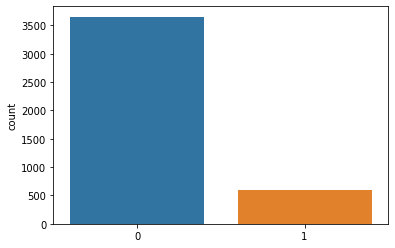

In [8]:
sns.countplot(target)

### Check correlation between features and the target column

<AxesSubplot:>

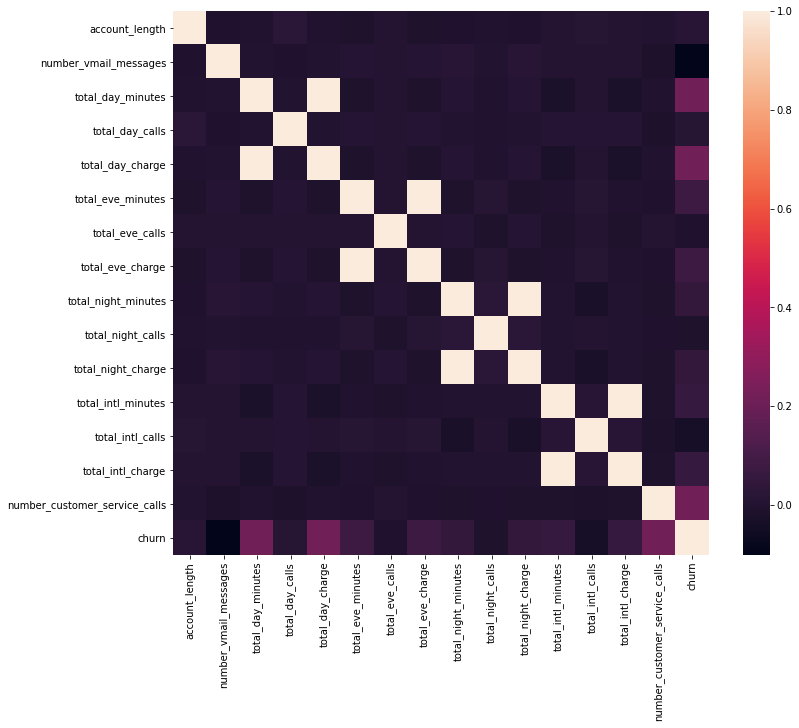

In [9]:
plt.figure(figsize=(12, 10))
sns.heatmap(train_data.corr())

In [10]:
train_data.corr()['churn']

account_length                   0.019378
number_vmail_messages           -0.100347
total_day_minutes                0.215272
total_day_calls                  0.011640
total_day_charge                 0.215263
total_eve_minutes                0.078855
total_eve_calls                 -0.006817
total_eve_charge                 0.078852
total_night_minutes              0.046647
total_night_calls               -0.012699
total_night_charge               0.046641
total_intl_minutes               0.055186
total_intl_calls                -0.034334
total_intl_charge                0.055177
number_customer_service_calls    0.221220
churn                            1.000000
Name: churn, dtype: float64

In [11]:
features.head()

,state,account_length,area_code,international_plan,voice_mail_plan,number_vmail_messages,total_day_minutes,total_day_calls,total_day_charge,total_eve_minutes,total_eve_calls,total_eve_charge,total_night_minutes,total_night_calls,total_night_charge,total_intl_minutes,total_intl_calls,total_intl_charge,number_customer_service_calls
0,OH,107,area_code_415,no,yes,26,161.6,123,27.47,195.5,103,16.62,254.4,103,11.45,13.7,3,3.70,1
1,NJ,137,area_code_415,no,no,0,243.4,114,41.38,121.2,110,10.30,162.6,104,7.32,12.2,5,3.29,0
2,OH,84,area_code_408,yes,no,0,299.4,71,50.90,61.9,88,5.26,196.9,89,8.86,6.6,7,1.78,2
3,OK,75,area_code_415,yes,no,0,166.7,113,28.34,148.3,122,12.61,186.9,121,8.41,10.1,3,2.73,3
4,MA,121,area_code_510,no,yes,24,218.2,88,37.09,348.5,108,29.62,212.6,118,9.57,7.5,7,2.03,3


### Check for missing data

In [12]:
features.isnull().sum(axis=0)

state                            0
account_length                   0
area_code                        0
international_plan               0
voice_mail_plan                  0
number_vmail_messages            0
total_day_minutes                0
total_day_calls                  0
total_day_charge                 0
total_eve_minutes                0
total_eve_calls                  0
total_eve_charge                 0
total_night_minutes              0
total_night_calls                0
total_night_charge               0
total_intl_minutes               0
total_intl_calls                 0
total_intl_charge                0
number_customer_service_calls    0
dtype: int64

In [13]:
features.describe()

,account_length,number_vmail_messages,total_day_minutes,total_day_calls,total_day_charge,total_eve_minutes,total_eve_calls,total_eve_charge,total_night_minutes,total_night_calls,total_night_charge,total_intl_minutes,total_intl_calls,total_intl_charge,number_customer_service_calls
count,4250.000000,4250.000000,4250.000000,4250.000000,4250.000000,4250.000000,4250.000000,4250.000000,4250.000000,4250.000000,4250.000000,4250.000000,4250.000000,4250.000000,4250.000000
mean,100.236235,7.631765,180.259600,99.907294,30.644682,200.173906,100.176471,17.015012,200.527882,99.839529,9.023892,10.256071,4.426353,2.769654,1.559059
std,39.698401,13.439882,54.012373,19.850817,9.182096,50.249518,19.908591,4.271212,50.353548,20.093220,2.265922,2.760102,2.463069,0.745204,1.311434
min,1.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
25%,73.000000,0.000000,143.325000,87.000000,24.365000,165.925000,87.000000,14.102500,167.225000,86.000000,7.522500,8.500000,3.000000,2.300000,1.000000
50%,100.000000,0.000000,180.450000,100.000000,30.680000,200.700000,100.000000,17.060000,200.450000,100.000000,9.020000,10.300000,4.000000,2.780000,1.000000
75%,127.000000,16.000000,216.200000,113.000000,36.750000,233.775000,114.000000,19.867500,234.700000,113.000000,10.560000,12.000000,6.000000,3.240000,2.000000
max,243.000000,52.000000,351.500000,165.000000,59.760000,359.300000,170.000000,30.540000,395.000000,175.000000,17.770000,20.000000,20.000000,5.400000,9.000000


### Preprocesing

In [14]:
features.drop(labels=['state', 'area_code'], axis=1, inplace=True)

In [15]:
features.head()

,account_length,international_plan,voice_mail_plan,number_vmail_messages,total_day_minutes,total_day_calls,total_day_charge,total_eve_minutes,total_eve_calls,total_eve_charge,total_night_minutes,total_night_calls,total_night_charge,total_intl_minutes,total_intl_calls,total_intl_charge,number_customer_service_calls
0,107,no,yes,26,161.6,123,27.47,195.5,103,16.62,254.4,103,11.45,13.7,3,3.70,1
1,137,no,no,0,243.4,114,41.38,121.2,110,10.30,162.6,104,7.32,12.2,5,3.29,0
2,84,yes,no,0,299.4,71,50.90,61.9,88,5.26,196.9,89,8.86,6.6,7,1.78,2
3,75,yes,no,0,166.7,113,28.34,148.3,122,12.61,186.9,121,8.41,10.1,3,2.73,3
4,121,no,yes,24,218.2,88,37.09,348.5,108,29.62,212.6,118,9.57,7.5,7,2.03,3


In [16]:
features['international_plan'] = np.where(features['international_plan'] == "no", 0, 1)
features['voice_mail_plan'] = np.where(features['voice_mail_plan'] == "no", 0, 1)

In [17]:
features.head()

,account_length,international_plan,voice_mail_plan,number_vmail_messages,total_day_minutes,total_day_calls,total_day_charge,total_eve_minutes,total_eve_calls,total_eve_charge,total_night_minutes,total_night_calls,total_night_charge,total_intl_minutes,total_intl_calls,total_intl_charge,number_customer_service_calls
0,107,0,1,26,161.6,123,27.47,195.5,103,16.62,254.4,103,11.45,13.7,3,3.70,1
1,137,0,0,0,243.4,114,41.38,121.2,110,10.30,162.6,104,7.32,12.2,5,3.29,0
2,84,1,0,0,299.4,71,50.90,61.9,88,5.26,196.9,89,8.86,6.6,7,1.78,2
3,75,1,0,0,166.7,113,28.34,148.3,122,12.61,186.9,121,8.41,10.1,3,2.73,3
4,121,0,1,24,218.2,88,37.09,348.5,108,29.62,212.6,118,9.57,7.5,7,2.03,3


In [18]:
features['targets'] = target

In [19]:
features.head()

,account_length,international_plan,voice_mail_plan,number_vmail_messages,total_day_minutes,total_day_calls,total_day_charge,total_eve_minutes,total_eve_calls,total_eve_charge,total_night_minutes,total_night_calls,total_night_charge,total_intl_minutes,total_intl_calls,total_intl_charge,number_customer_service_calls,targets
0,107,0,1,26,161.6,123,27.47,195.5,103,16.62,254.4,103,11.45,13.7,3,3.70,1,0
1,137,0,0,0,243.4,114,41.38,121.2,110,10.30,162.6,104,7.32,12.2,5,3.29,0,0
2,84,1,0,0,299.4,71,50.90,61.9,88,5.26,196.9,89,8.86,6.6,7,1.78,2,0
3,75,1,0,0,166.7,113,28.34,148.3,122,12.61,186.9,121,8.41,10.1,3,2.73,3,0
4,121,0,1,24,218.2,88,37.09,348.5,108,29.62,212.6,118,9.57,7.5,7,2.03,3,0


In [20]:
features.to_csv("data/cleaned_train.csv", index=False)

### Pandas Profiling

In [32]:
!pip install pandas-profiling

  Created wheel for htmlmin: filename=htmlmin-0.1.12-py3-none-any.whl size=27090 sha256=cab8b28f45247df31b316b6780ccfdb1ba468d1c05c47e92c146fc0786194fa5
  Stored in directory: c:\users\marakujaaleluja\appdata\local\pip\cache\wheels\23\14\6e\4be5bfeeb027f4939a01764b48edd5996acf574b0913fe5243
  Created wheel for imagehash: filename=ImageHash-4.1.0-py2.py3-none-any.whl size=291996 sha256=f4601bf42bd497568a13f187f524b520e86416c2218edb23edbfde74906246d4
  Stored in directory: c:\users\marakujaaleluja\appdata\local\pip\cache\wheels\cc\57\bb\6f9f52a6d8187b8f806210e3378837aa4dc6219cd64cb99846
Successfully built htmlmin imagehash


In [33]:
from pandas_profiling import ProfileReport

In [34]:
report = ProfileReport(train_data, title="Churn dataset")

In [37]:
report

## Making churn reason dataset

https://techsee.me/resources/surveys/2019-telecom-churn-survey/

c:\users\marakujaaleluja\anaconda3\envs\tf_gpu\lib\site-packages\seaborn\distributions.py:2551: FutureWarning: `distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `histplot` (an axes-level function for histograms).
  warnings.warn(msg, FutureWarning)
c:\users\marakujaaleluja\anaconda3\envs\tf_gpu\lib\site-packages\seaborn\distributions.py:2551: FutureWarning: `distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `histplot` (an axes-level function for histograms).
  warnings.warn(msg, FutureWarning)


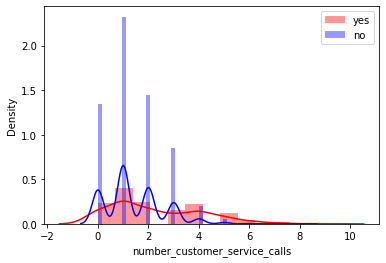

In [21]:
churn_yes = features['number_customer_service_calls'][target==1]
churn_no = features['number_customer_service_calls'][target==0]
sns.distplot(churn_yes, color="red", label="yes",)
sns.distplot(churn_no, color="blue", label="no",)
plt.legend()
plt.show()

c:\users\marakujaaleluja\anaconda3\envs\tf_gpu\lib\site-packages\seaborn\distributions.py:2551: FutureWarning: `distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `histplot` (an axes-level function for histograms).
  warnings.warn(msg, FutureWarning)
c:\users\marakujaaleluja\anaconda3\envs\tf_gpu\lib\site-packages\seaborn\distributions.py:2551: FutureWarning: `distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `histplot` (an axes-level function for histograms).
  warnings.warn(msg, FutureWarning)


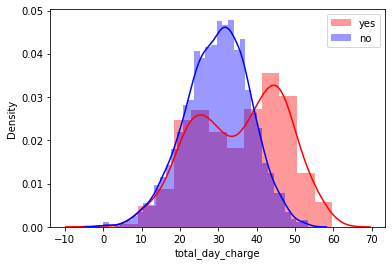

In [22]:
churn_yes = features['total_day_charge'][target==1]
churn_no = features['total_day_charge'][target==0]
sns.distplot(churn_yes, color="red", label="yes",)
sns.distplot(churn_no, color="blue", label="no",)
plt.legend()
plt.show()

In [25]:
features['number_customer_service_calls'][target==0].mean(axis=0)

1.4416757940854326

In [27]:
regular_avg_custer_calls = features['number_customer_service_calls'][target==0].mean(axis=0)

In [26]:
features['total_day_charge'][target==0].mean(axis=0)

29.844947973713033

In [28]:
regular_avg_day_charge = features['total_day_charge'][target==0].mean(axis=0)

### Make Targets for churn reason dataset

In [32]:
reason_targets = []
churn_customers = features.iloc[np.where(target==1)[0], :-1]
churn_customers.reset_index(inplace=True, drop=True)
for i in range(len(churn_customers)):
    
    customer = churn_customers.iloc[i]
    
    if customer['number_customer_service_calls'] > regular_avg_custer_calls:
        reason_targets.append(1)
    elif customer['total_day_charge'] > regular_avg_day_charge:
        reason_targets.append(2)
    else:
        reason_targets.append(0)

In [33]:
churn_customers['target'] = reason_targets

In [34]:
churn_customers.head()

,account_length,international_plan,voice_mail_plan,number_vmail_messages,total_day_minutes,total_day_calls,total_day_charge,total_eve_minutes,total_eve_calls,total_eve_charge,total_night_minutes,total_night_calls,total_night_charge,total_intl_minutes,total_intl_calls,total_intl_charge,number_customer_service_calls,target
0,65,0,0,0,129.1,137,21.95,228.5,83,19.42,208.8,111,9.40,12.7,6,3.43,4,1
1,161,0,0,0,332.9,67,56.59,317.8,97,27.01,160.6,128,7.23,5.4,9,1.46,4,1
2,77,0,0,0,62.4,89,10.61,169.9,121,14.44,209.6,64,9.43,5.7,6,1.54,5,1
3,12,0,0,0,249.6,118,42.43,252.4,119,21.45,280.2,90,12.61,11.8,3,3.19,1,2
4,135,1,1,41,173.1,85,29.43,203.9,107,17.33,122.2,78,5.50,14.6,15,3.94,0,0


In [35]:
churn_customers.to_csv("data/churn_reason_train.csv", index=False)